In [1]:
import numpy as np
import os
import time
import scipy
import glob
import sys
from datetime import datetime

import pandas as pd
from scipy.stats import binned_statistic_2d
import scipy.stats as sts

import matplotlib as mpl
mpl.use('nbagg')
import seaborn as sns
import pylab as pl

import importlib

import pandas as pd
# from scipy.stats import binned_statistic_2d

# import some custom funcs
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import utils as util
import behavior as butil
import google_drive as gdrive

In [2]:
util.set_sns_style(style='dark')
%matplotlib.notebook

UsageError: Line magic function `%matplotlib.notebook` not found.


In [3]:
# rootdir='/Users/julianarhee/Library/CloudStorage/GoogleDrive-edge.tracking.ru@gmail.com/My Drive/Edge_Tracking/Data'
rootdir = util.get_rootdir()
print(rootdir)
rootdir = rootdir.replace('Data', 'Analysis')
experiment = 'gradient_vs_constant-odor'

strip_width = 50
strip_sep = 200
fig_id = os.path.join('/Edge_Tracking', rootdir.split('/Edge_Tracking/')[1], experiment)
print(fig_id)

/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data
/Edge_Tracking/Analysis/gradient_vs_constant-odor


In [4]:
# srcdir = os.path.join(rootdir, experiment)
# savedir = '/Users/julianarhee/Documents/rutalab/data/gdrive/{}'.format(experiment)
# savedir = savedir.replace(" ", "")
# figdir = os.path.join(savedir, 'figures')
# print("Saving figures to:{}    {}".format('\n', figdir))
# if not os.path.exists(figdir):
#     os.makedirs(figdir)
savedir = '{}/jyr/{}'.format(rootdir.replace('Analysis', 'Data'), experiment)
savedir = savedir.replace(" ", "")
figdir = os.path.join(savedir, 'figures')
print("Saving figures to:{}    {}".format('\n', figdir))
if not os.path.exists(figdir):
    os.makedirs(figdir)

Saving figures to:
    /home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/jyr/gradient_vs_constant-odor/figures


In [9]:
# experiment_list = ['0-degree', 'Spontaneous_edge_tracking']
experiment_list = ['constant_vs_gradient']
if experiment=='constant_vs_gradient':
    logdir_name = 'gradient_vs_constant-odor'
    
logdf = gdrive.get_info_from_gsheet(experiment)
log_files = [glob.glob(os.path.join(rootdir.replace('Analysis', 'Data'), logdir_name,
                       '**', '{}'.format(f)), recursive=True)[0] for f in logdf['log']]
len(log_files)

COMPLETE: Data copied


31

In [11]:
importlib.reload(butil)

<module 'behavior' from '/home/julianarhee/Repositories/plume-tracking/behavior.py'>

In [12]:
# log_files = sorted(butil.get_log_files(experiment=experiment, 
#                                 verbose=False, rootdir=rootdir, is_gdrive=True), key=util.natsort)
# # Load dataframes
df0_all = butil.load_combined_df(log_files=log_files, save=True, 
                             savedir=savedir, verbose=True, parse_filename=True,
                             create_new=True, remove_invalid=True, process=True,
                             rootdir=rootdir)

Processing 31 tracking files.
0 10272020-155449 fly1 constantodor1
1 10272020-171053 fly1 constantodor2
2 10272020-185128 fly2 constantodor1
3 10272020-191634 fly2 constantodor2
4 10272020-210752 fly3 constantodor1
5 10272020-211853 fly3 constantodor2
6 10282020-172349 fly4 constantodor1
7 10282020-175124 fly4 constantodor2
8 10282020-182615 fly5 constantodor1
9 10282020-185857 fly5 constantodor2
10 10282020-202124 fly6 constantodor1
11 10282020-204027 fly6 constantodor2
12 10282020-211843 fly7 constantodor1
13 10282020-213508 fly7 constantodor2
14 10282020-220510 fly8 constantodor1
15 10282020-223816 fly8 constant2
16 10272020-172857 fly1 gradient1
17 10272020-175525 fly1 gradient2
18 10272020-194958 fly2 gradient1
19 10272020-200122 fly2 gradient2
20 10272020-212830 fly3 gradient1
21 10272020-213302 fly3 gradient2
22 10282020-174715 fly4 gradient1
23 10282020-175737 fly4 gradient2
[WARNING] 10282020-175737_gradient2_Fly4: Found bad skips, removing 3429 of 5135 samples.
24 10282020-18

/home/julianarhee/Repositories/plume-tracking/behavior.py:1001: RuntimeWarning: divide by zero encountered in divide
  speed = np.linalg.norm(np.array([xv, yv]), axis=0)/tv #avg_tdiff #np.sqrt(xv**2+yv**2)
/home/julianarhee/Repositories/plume-tracking/behavior.py:1005: RuntimeWarning: divide by zero encountered in divide
  df0['upwind_speed'] = yv/tv #avg_tdiff
/home/julianarhee/Repositories/plume-tracking/behavior.py:1006: RuntimeWarning: divide by zero encountered in divide
  df0['crosswind_speed'] = xv/tv #avg_tdiff


... processing 20201027-fly1_10272020-172857
Found 16 bouts too short (thr=0.50 sec)
... processing 20201027-fly1_10272020-175525
Found 3 bouts too short (thr=0.50 sec)
... processing 20201027-fly2_10272020-185128
Found 68 bouts too short (thr=0.50 sec)
... processing 20201027-fly2_10272020-191634
Found 25 bouts too short (thr=0.50 sec)
... processing 20201027-fly2_10272020-194958
Found 5 bouts too short (thr=0.50 sec)
... processing 20201027-fly2_10272020-200122
Found 7 bouts too short (thr=0.50 sec)
... processing 20201027-fly3_10272020-210752
Found 19 bouts too short (thr=0.50 sec)
... processing 20201027-fly3_10272020-211853
Found 0 bouts too short (thr=0.50 sec)
... processing 20201027-fly3_10272020-212830
Found 0 bouts too short (thr=0.50 sec)
... processing 20201027-fly3_10272020-213302
Found 0 bouts too short (thr=0.50 sec)
... processing 20201028-fly4_10282020-172349
Found 5 bouts too short (thr=0.50 sec)
... processing 20201028-fly4_10282020-174715
Found 0 bouts too short (th

In [17]:
fn = log_files[0]
fn

'/home/julianarhee/edgetracking-googledrive/Edge_Tracking/Data/gradient_vs_constant-odor/constant_odor/10272020-155449_constantOdor1_Fly1.log'

In [13]:
# # Load dataframes
# df0_all = butil.load_combined_df(log_files=log_files, save=True, 
#                                  savedir=savedir, verbose=True, parse_filename=True,
#                                  create_new=True, remove_invalid=True, process=True,
#                                  rootdir=rootdir)
condition_list = df0_all['condition'].unique()
print("There are {} unique conditions:".format(len(condition_list)))
for ci, cond in enumerate(condition_list):
    print(ci, cond)  

There are 5 unique conditions:
0 constantodor1
1 constantodor2
2 gradient1
3 gradient2
4 constant2


In [14]:
df0_all[['condition', 'trial_id']].drop_duplicates().groupby('condition').count()

,trial_id
condition,
constant2,1
constantodor1,8
constantodor2,7
gradient1,8
gradient2,7


# plotting

In [25]:
outstrip_c = [0.7]*3
instrip_c = 'r'
instrip_palette={True: instrip_c, False: outstrip_c}
strip_palette = {'constant': 'w', 'gradient': 'gray', }

#### flip paths to border along strip's RIGHT edge

In [32]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [33]:
d_list=[]
borders = {}
for trial_id, df_ in df0_all.groupby('trial_id'):
    fp_, borders_fp = butil.check_entryside_and_flip(df_, strip_width=strip_width)
    d_list.append(fp_)
    borders.update({trial_id: borders_fp})
df_fp = pd.concat(d_list)

... Using default odor min/max, animal 20200908-fly7 did not move in odor


In [34]:
%matplotlib notebook

In [37]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [38]:
for fly_id, df_ in df0_all.groupby('fly_id'):
    odor_borders = butil.find_strip_borders(df_)

KeyError: 0

<IPython.core.display.Javascript object>


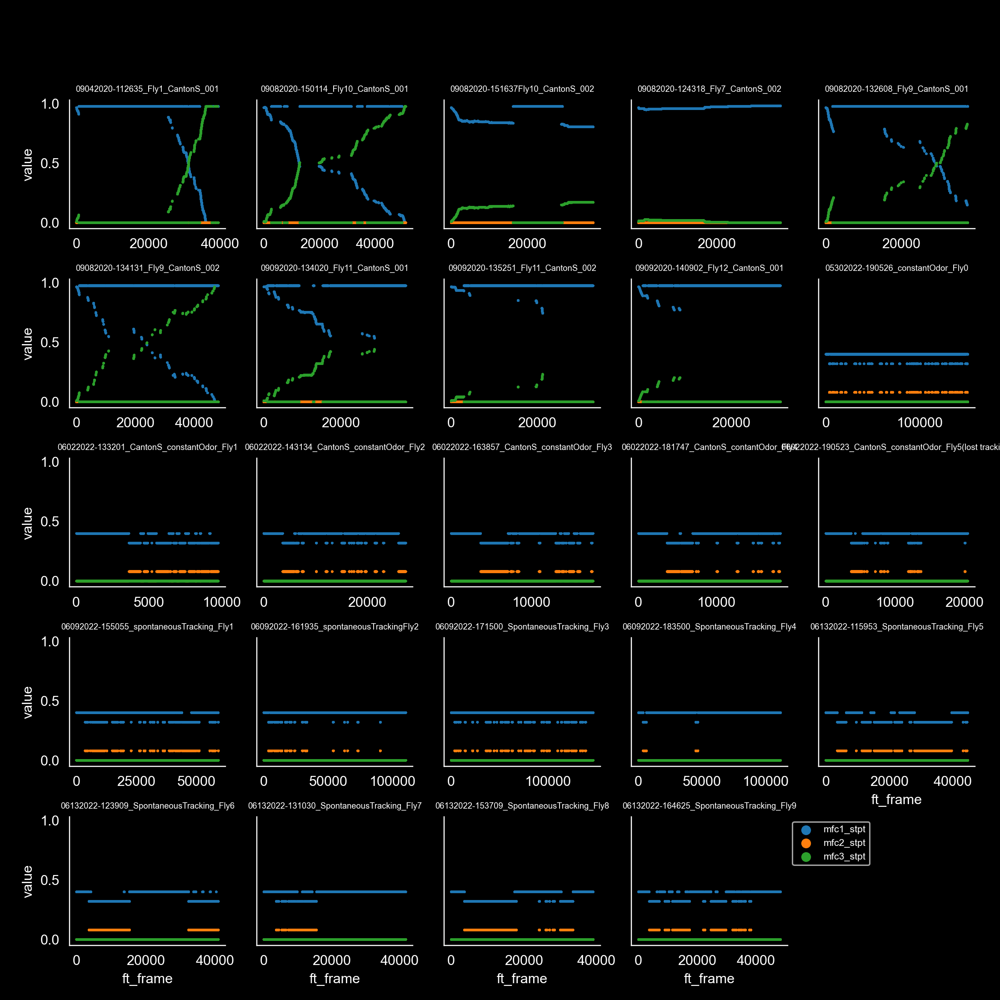

In [201]:
# def check_mfc_vars(df0_all, figdir=None, plot=True):
#     if figdir is None:
#         # just save to parent dir
#         plot=False
#     mfc_vars = [c for c in df0_all.columns if 'mfc' in c]
#     melt_cols = [c for c in df0_all.columns if c not in mfc_vars]
#     meltdf = df0_all.melt(melt_cols)
#     g = sns.FacetGrid(meltdf, col='filename', col_wrap=5, height=2, sharex=False)
#     g.map_dataframe(sns.scatterplot, x='ft_frame', y='value', hue='variable', 
#                     edgecolor='none', s=3)
#     g.set_titles(row_template='{row_name}', col_template='{col_name}', size=6)
#     g.axes.flat[-1].legend(bbox_to_anchor=(1,1), loc='upper left', fontsize=7)
#     pl.subplots_adjust(top=0.9)
#     util.label_figure(g.fig, fig_id)
#     pl.savefig(os.path.join(figdir, 'mfc_vars.png'))

fig = butil.check_mfc_vars(df0_all)
util.label_figure(g.fig, fig_id)
pl.savefig(os.path.join(figdir, 'mfc_vars.png'))
    

In [190]:
for fn, df_ in df0_all.groupby('filename'):
    mfc_vals = len([c for c in mfc_vars if len(df_[c].unique())>2]) == 2
    print(fn, mfc_vals)

on_off = [c for c in mfc_vars if len(df_[c].unique())>1] #== 2
odor_mfc = [c for c in on_off if c!='mfc1_stpt'][0]

is_gradient = len([c for c in mfc_vars if len(df_[c].unique())>2]) == 2
is_gradient

05302022-190526_constantOdor_Fly0 False
06022022-133201_CantonS_constantOdor_Fly1 False
06022022-143134_CantonS_constantOdor_Fly2 False
06022022-163857_CantonS_constantOdor_Fly3 False
06022022-181747_CantonS_contantOdor_Fly4 False
06022022-190523_CantonS_constantOdor_Fly5(lost tracking) False
06092022-155055_spontaneousTracking_Fly1 False
06092022-161935_spontaneousTrackingFly2 False
06092022-171500_SpontaneousTracking_Fly3 False
06092022-183500_SpontaneousTracking_Fly4 False
06132022-115953_SpontaneousTracking_Fly5 False
06132022-123909_SpontaneousTracking_Fly6 False
06132022-131030_SpontaneousTracking_Fly7 False
06132022-153709_SpontaneousTracking_Fly8 False
06132022-164625_SpontaneousTracking_Fly9 False
09042020-112635_Fly1_CantonS_001 True
09082020-124318_Fly7_CantonS_002 True
09082020-132608_Fly9_CantonS_001 True
09082020-134131_Fly9_CantonS_002 True
09082020-150114_Fly10_CantonS_001 True
09082020-151637Fly10_CantonS_002 True
09092020-134020_Fly11_CantonS_001 True
09092020-135251_

<IPython.core.display.Javascript object>


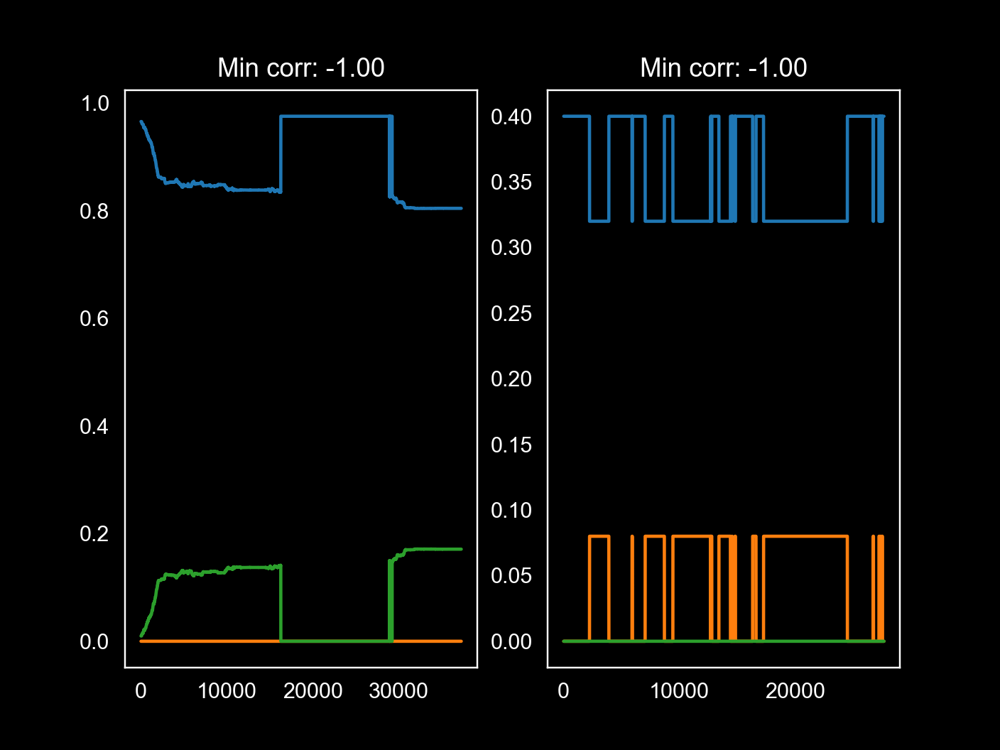

In [180]:
fn_check = ['09082020-151637Fly10_CantonS_002', '06132022-115953_SpontaneousTracking_Fly5']
#rel_vars = [c for c in mfc_vars if len(df_[c].unique())>1]
#mincorr = np.corrcoef(df_[rel_vars[0]], df_[rel_vars[1]]).min()

fig, axn = pl.subplots(1,2)
for ax, fn in zip(axn.flat, fn_check):
    df_ = df0_all[df0_all['filename']==fn].copy()
    rel_vars = [c for c in mfc_vars if len(df_[c].unique())>1]
    mincorr = np.corrcoef(df_[rel_vars[0]], df_[rel_vars[1]]).min()

    ax.plot(df_['mfc1_stpt'])
    ax.plot(df_['mfc2_stpt'])
    ax.plot(df_['mfc3_stpt'])
    ax.set_title("Min corr: {:.2f}".format(mincorr))
    

-0.9999999999999998

In [148]:
df0_all['filename']

0                09042020-112635_Fly1_CantonS_001
1                09042020-112635_Fly1_CantonS_001
2                09042020-112635_Fly1_CantonS_001
3                09042020-112635_Fly1_CantonS_001
4                09042020-112635_Fly1_CantonS_001
                           ...                   
28008    06132022-164625_SpontaneousTracking_Fly9
28009    06132022-164625_SpontaneousTracking_Fly9
28010    06132022-164625_SpontaneousTracking_Fly9
28011    06132022-164625_SpontaneousTracking_Fly9
28012    06132022-164625_SpontaneousTracking_Fly9
Name: filename, Length: 881461, dtype: object

In [144]:
# entry_ix = df_[df_['instrip']].iloc[0].name
# print(entry_ix)
# entry_left_edge, entry_lefts = butil.check_entry_left_edge(df_, entry_ix=entry_ix, return_bool=True)

<IPython.core.display.Javascript object>


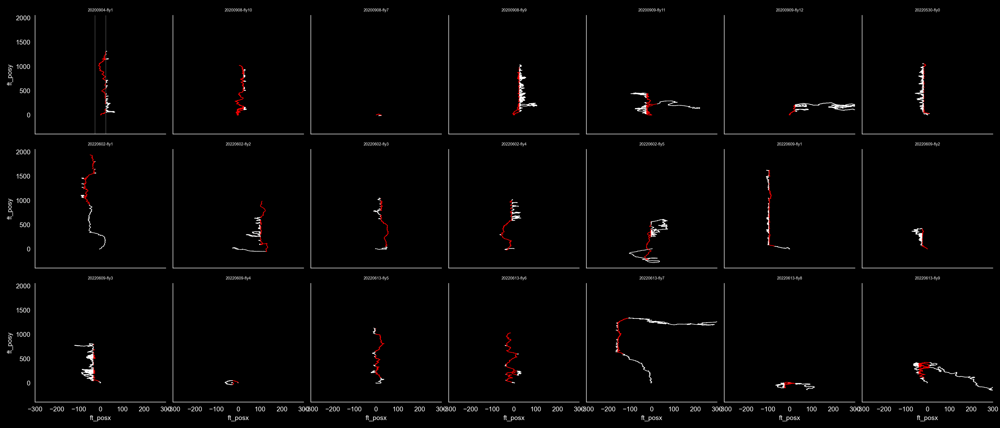

KeyError: 0

In [119]:
# fig = butil.plot_fly_by_condition(df_fp, hue_varname='instrip')
fig = butil.plot_all_flies(df0_all, col_wrap=7)
pl.savefig(os.path.join(figdir, 'traj.png'))
print(savedir)
fig = butil.plot_all_flies(df_fp, col_wrap=7)
pl.savefig(os.path.join(figdir, 'traj-flipped.png'))
print(savedir)

### Adjust some vars

In [15]:
df_fp['fly_id'].unique()

array(['20200904-fly1', '20200908-fly10', '20200908-fly7',
       '20200908-fly9', '20200909-fly11', '20200909-fly12',
       '20220530-fly0', '20220602-fly1', '20220602-fly2', '20220602-fly3',
       '20220602-fly4', '20220602-fly5', '20220609-fly1', '20220609-fly2',
       '20220609-fly3', '20220609-fly4', '20220613-fly5', '20220613-fly6',
       '20220613-fly7', '20220613-fly8', '20220613-fly9'], dtype=object)

In [16]:
excl_flies = ['20201028-fly4', '20201028-fly6']

df0 = df_fp[~df_fp['fly_id'].isin(excl_flies)].copy()
if experiment=='constant_v_gradient':
    df0.loc[df0['condition'].isin(['constantodor1', 'constantodor2']), 'strip_type'] = 'constant'
    df0.loc[df0['condition'].isin(['gradient1', 'gradient2']), 'strip_type'] = 'gradient'
else:
    df0['strip_type'] = 'constant'
    
df0.loc[df0['instrip'], 'bout_type'] = 'instrip'
df0.loc[~df0['instrip'], 'bout_type'] = 'outstrip'
df0['inout-strip'] = ['{}-{}'.format(v1, v2) for v1, v2 \
                         in df0[['strip_type', 'bout_type']].values]

In [82]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [93]:
metrics = df0.groupby(['fly_id', 'condition', 'boutnum'], as_index=True)\
             .apply(butil.calculate_bout_metrics).unstack().reset_index() #.reset_index()
metrics

,fly_id,condition,boutnum,average_heading,bout_type,crosswind_dist_firstlast,crosswind_dist_range,crosswind_speed,date,duration,...,path_length,rel_time,sig_status,speed,strip_type,trial,trial_id,upwind_dist_firstlast,upwind_dist_range,upwind_speed
0,20200904-fly1,cantons_constantodor,1,-0.295787,instrip,24.940882,24.941584,2.338515,20200904,10.753286,...,NaN,0.0,NaN,8.581523,constant,09042020-112635,20200904-fly1_09042020-112635,57.166431,57.208471,5.33766
1,20200904-fly1,cantons_constantodor,2,-0.062064,outstrip,0.113949,41.185597,0.008638,20200904,415.126799,...,610.020806,10.769246,NaN,1.214595,constant,09042020-112635,20200904-fly1_09042020-112635,25.636996,31.250131,0.057044
2,20200904-fly1,cantons_constantodor,3,1.657653,instrip,-0.101356,3.664478,0.078352,20200904,1.799193,...,13.650723,425.913998,NaN,7.626711,constant,09042020-112635,20200904-fly1_09042020-112635,6.959732,7.61906,3.937622
3,20200904-fly1,cantons_constantodor,4,0.180224,outstrip,0.053753,8.8585,0.026931,20200904,4.060137,...,38.154526,427.730139,NaN,9.198898,constant,09042020-112635,20200904-fly1_09042020-112635,17.066172,17.066172,4.239485
4,20200904-fly1,cantons_constantodor,5,1.09478,instrip,-0.078792,5.152978,0.052704,20200904,1.497991,...,17.36127,431.810223,NaN,11.664719,constant,09042020-112635,20200904-fly1_09042020-112635,3.458827,4.661183,2.342603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929,20220613-fly9,cantons_constantodor,29,2.34273,outstrip,-0.117291,2.639554,-0.215321,20220613,1.644176,...,7.020893,595.407134,0.0,4.181603,constant,06132022-164625,20220613-fly9_06132022-164625,-3.174662,3.174662,-2.062423
930,20220613-fly9,cantons_constantodor,30,-3.054421,instrip,-0.000702,1.472791,-0.237211,20220613,0.870551,...,7.182278,597.08448,0.0,8.022881,constant,06132022-164625,20220613-fly9_06132022-164625,-5.864074,5.934709,-6.670578
931,20220613-fly9,cantons_constantodor,31,-3.045515,outstrip,-0.032505,19.146608,0.012028,20220613,22.184405,...,130.551709,597.987073,NaN,5.612783,constant,06132022-164625,20220613-fly9_06132022-164625,-48.459816,59.386165,-2.237756
932,20220613-fly9,cantons_constantodor,32,-0.564903,instrip,-49.740161,49.740161,5.82816,20220613,8.547553,...,93.359174,620.203764,NaN,10.816978,constant,06132022-164625,20220613-fly9_06132022-164625,46.536251,53.530553,5.380851


<IPython.core.display.Javascript object>


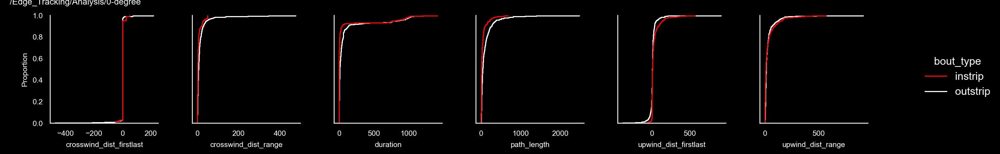

/Users/julianarhee/Documents/rutalab/data/gdrive/0-degree/figures ecdf-metrics_bout_type_None


In [97]:
# outstrip_c = [0.7]*3
# instrip_c = 'r'
curr_palette = instrip_palette
hue_var='bout_type'
row_var=None #'strip_type'
labels = ['instrip', 'outstrip'] if hue_var=='bout_type' else ['constant', 'gradient']
colors = ['r', 'w'] if hue_var=='bout_type' else ['w', 'c'] 
cumulative=True

plot_type = 'ecdf' if cumulative else 'hist'
stat='probability'
plot_log = False
if plot_log:
    cumulative = False
limit_xaxis = True #@not plot_log
# ----
plot_vars = ['duration', 'upwind_dist_range', 'upwind_dist_firstlast', \
             'crosswind_dist_range', 'crosswind_dist_firstlast', 'path_length']
if cumulative:
    fig = butil.plot_metrics_displot(metrics, plot_vars, hue_var=hue_var, row_var=row_var,
                    labels=labels, colors=colors)
else:
    fig = butil.plot_metrics_hist(metrics, plot_vars, hue_var=hue_var, row_var=row_var,
                             labels=labels, colors=colors, cumulative=cumulative, 
                                  stat=stat, plot_log=plot_log)
pl.tight_layout()
pl.subplots_adjust(top=0.9, hspace=0.5, right=0.9, bottom=0.2)
util.label_figure(fig, fig_id)
figname = '{}-metrics_{}_{}'.format(plot_type, hue_var, row_var)
figname = '{}_log'.format(figname) if plot_log else figname
pl.savefig(os.path.join(figdir, '{}.png'.format(figname)))
print(figdir, figname)

In [99]:
# ign_cols = ['experiment', 'fly_name', 'trial', 'motor_step_command', 'led2_stpt', 'level_3',
#            'mfc1_stpt', 'mfc2_stpt', 'mfc3_stpt', 'led1_stpt', 'date']
# quant_cols = [c for c in metrics.columns if c not in ign_cols]
# qmetrics = metrics[quant_cols].copy()
# quant_grouper = ['fly_id', 'trial_id', 'instrip', 'condition', 'boutnum', \
#                  'strip_type', 'bout_type', 'inout-strip']
meandf = metrics.groupby(id_cols, as_index=True).mean().reset_index()
meandf.head()

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_11780/2071157807.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  meandf = metrics.groupby(id_cols, as_index=True).mean().reset_index()


,fly_id,trial_id,condition,strip_type,instrip,bout_type,inout-strip,boutnum,average_heading,crosswind_dist_firstlast,...,mfc1_stpt,mfc2_stpt,mfc3_stpt,path_length,rel_time,sig_status,speed,upwind_dist_firstlast,upwind_dist_range,upwind_speed
0,20200904-fly1,20200904-fly1_09042020-112635,cantons_constantodor,constant,False,outstrip,constant-outstrip,2,-0.062064,0.113949,...,0.975976,0.0,0.0,610.020806,10.769246,NaN,1.214595,25.636996,31.250131,0.057044
1,20200904-fly1,20200904-fly1_09042020-112635,cantons_constantodor,constant,False,outstrip,constant-outstrip,4,0.180224,0.053753,...,0.975976,0.0,0.0,38.154526,427.730139,NaN,9.198898,17.066172,17.066172,4.239485
2,20200904-fly1,20200904-fly1_09042020-112635,cantons_constantodor,constant,False,outstrip,constant-outstrip,6,-1.477915,-0.437286,...,NaN,0.0,NaN,19.178644,433.322182,NaN,11.153151,-6.013966,7.069609,-3.750693
3,20200904-fly1,20200904-fly1_09042020-112635,cantons_constantodor,constant,False,outstrip,constant-outstrip,8,0.429990,0.217417,...,NaN,0.0,NaN,300.851876,436.735044,NaN,9.679434,109.856254,117.759029,3.690729
4,20200904-fly1,20200904-fly1_09042020-112635,cantons_constantodor,constant,False,outstrip,constant-outstrip,10,-0.423946,0.106261,...,0.975976,0.0,0.0,37.670047,469.844454,NaN,10.431463,9.488914,11.099882,2.795343


<IPython.core.display.Javascript object>


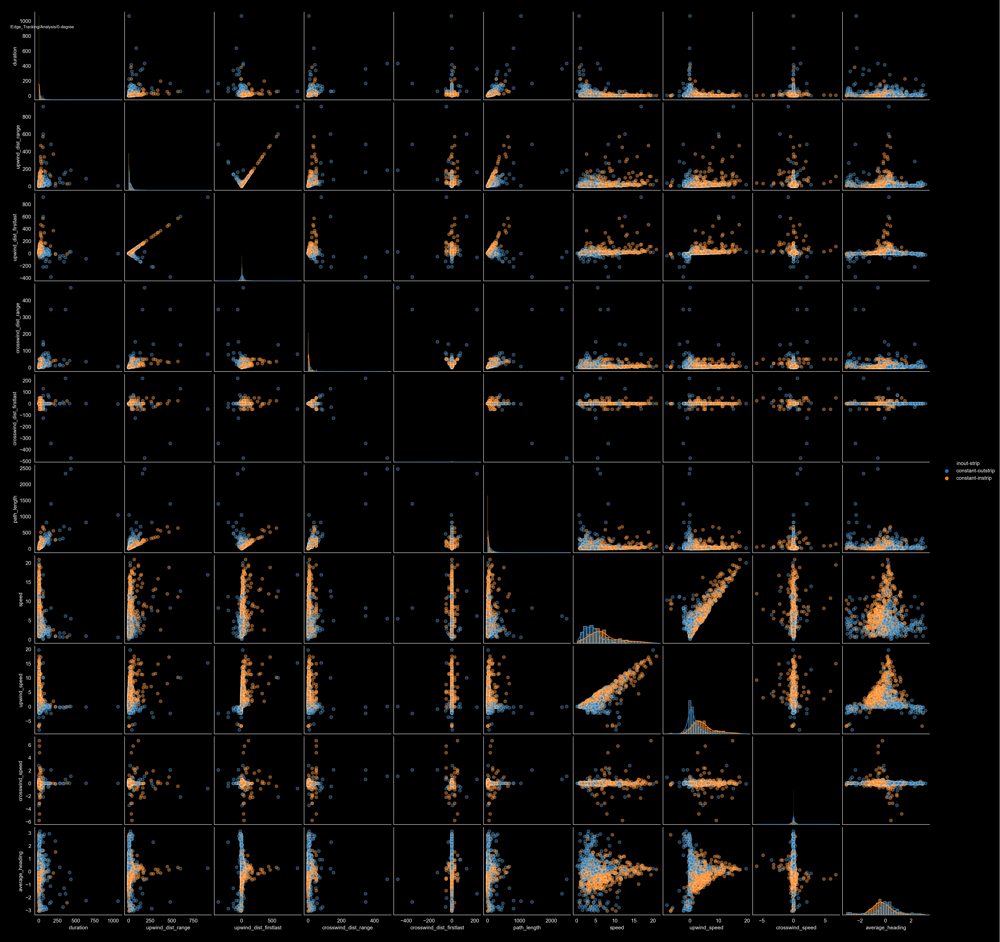

/Users/julianarhee/Documents/rutalab/data/gdrive/0-degree/figures


In [100]:
plot_vars = ['duration', 'upwind_dist_range', 'upwind_dist_firstlast', \
             'crosswind_dist_range','crosswind_dist_firstlast', 'path_length']
plot_vars.extend(['speed', 'upwind_speed', 'crosswind_speed', 'average_heading'])

g = sns.pairplot(meandf, hue='inout-strip', vars=plot_vars,
                 plot_kws={'alpha': 0.5},
                diag_kind='hist', 
                 diag_kws={'common_norm': False, 'kde': True, 'stat': 'probability'})

util.label_figure(g.fig, fig_id)

pl.savefig(os.path.join(figdir, 'pairplot.png'), edgecolor='none')
print(figdir)


<IPython.core.display.Javascript object>


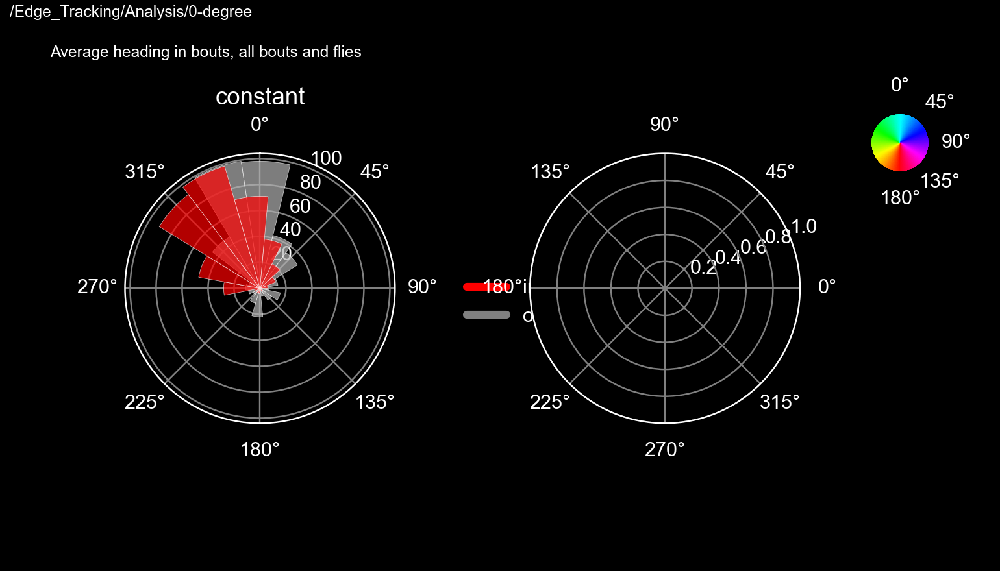

/Users/julianarhee/Documents/rutalab/data/gdrive/0-degree/figures polarhist_average_heading_in_bout


In [101]:
fig, axn = pl.subplots(1, 2, figsize=(7,4), subplot_kw={'projection': 'polar'})
for ax, (strip_type, df_) in zip(axn.flat, meandf.groupby('strip_type')):
    util.circular_hist(ax, df_[~df_['instrip']]['average_heading'].values, 
                   facecolor=outstrip_c, density=False, edgecolor='w', lw=0.25)
    util.circular_hist(ax, df_[df_['instrip']]['average_heading'].values, 
                   facecolor=instrip_c, density=False,  edgecolor='w', lw=0.25)
    ax.set_title(strip_type)

labels= ['instrip', 'outstrip']
legh = putil.custom_legend(labels, ['r', 'gray'])
ax.legend(handles=legh, labels=labels, bbox_to_anchor=(1.2, 0.6), loc='upper left', frameon=False)
util.add_colorwheel(fig, cmap='hsv', axes=[0.85, 0.7, 0.1, 0.1])

fig.text(0.05, 0.9, "Average heading in bouts, all bouts and flies", fontsize=8)

util.label_figure(fig, fig_id)
pl.subplots_adjust(right=0.8, wspace=0.5)
figname = 'polarhist_average_heading_in_bout'
pl.savefig(os.path.join(figdir, '{}.png'.format(figname)))
print(figdir, figname)

# average flies

In [125]:
flydf = meandf.groupby(['fly_id', 'inout-strip', 'condition', 'instrip', 'bout_type', 'strip_type']).mean().reset_index()
flydf.head()

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_3861/3968461528.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  flydf = meandf.groupby(['fly_id', 'inout-strip', 'condition', 'instrip', 'bout_type', 'strip_type']).mean().reset_index()


,fly_id,inout-strip,condition,instrip,bout_type,strip_type,boutnum,duration,upwind_dist_range,upwind_dist_firstlast,...,crosswind_dist_firstlast,path_length,average_heading,rel_time,speed,upwind_speed,crosswind_speed,sig_status,flipped,led_on
0,20200904-fly1,constant-instrip,cantons_constantodor,True,instrip,constant,18.0,6.374999,56.597035,56.014857,...,1.323756,78.721902,0.733232,486.050671,11.502044,8.404282,0.092510,NaN,0.0,NaN
1,20200904-fly1,constant-outstrip,cantons_constantodor,False,outstrip,constant,19.0,30.165870,20.925274,16.730100,...,0.047022,96.159184,0.025105,492.441188,9.163691,3.190548,0.040100,NaN,0.0,1.0
2,20200908-fly10,constant-instrip,cantons_constantodor,True,instrip,constant,26.0,10.962688,39.965100,39.651162,...,-0.982509,73.858948,0.565385,549.642030,5.674738,3.162413,-0.013740,NaN,0.0,NaN
3,20200908-fly10,constant-outstrip,cantons_constantodor,False,outstrip,constant,25.0,24.509152,6.671802,3.003311,...,-0.008538,64.710300,-0.449816,525.116077,3.004142,0.266955,0.000496,NaN,0.0,1.0
4,20200908-fly7,constant-instrip,cantons_constantodor,True,instrip,constant,1.0,380.919346,28.706844,-9.955069,...,23.267574,NaN,-2.415650,0.000000,0.709144,-0.026105,0.060681,NaN,0.0,NaN


<IPython.core.display.Javascript object>


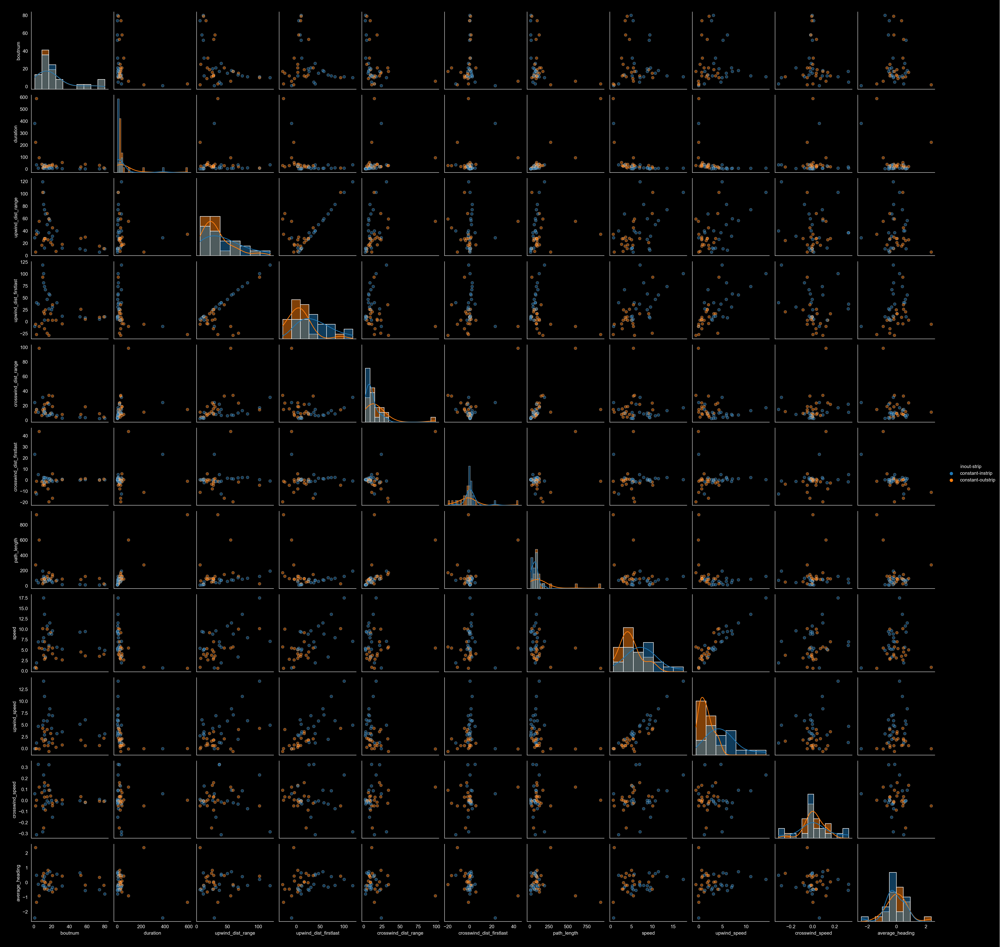

/Users/julianarhee/Documents/rutalab/data/gdrive/0-degree/figures


In [126]:
#plot_vars = ['boutnum', 'duration', 'upwind_dist', 'upwind_dist_avg', 'crosswind_dist', 'path_length']
#plot_vars.extend(['speed', 'upwind_speed', 'crosswind_speed', 'average_heading'])

plot_vars = ['boutnum', 'duration', 'upwind_dist_range', 'upwind_dist_firstlast', \
             'crosswind_dist_range','crosswind_dist_firstlast', 'path_length']
plot_vars.extend(['speed', 'upwind_speed', 'crosswind_speed', 'average_heading'])


g = sns.pairplot(flydf, hue='inout-strip', vars=plot_vars, 
                plot_kws={'alpha': 0.5},
                diag_kind='hist', diag_kws={'common_norm': False, 'kde': True, 'stat': 'probability'})

pl.savefig(os.path.join(figdir, 'pairplot_fly-avgs.png'), edgecolor='none')
print(figdir)


In [127]:
flydf['inout-strip'].unique()

array(['constant-instrip', 'constant-outstrip'], dtype=object)

In [128]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

<IPython.core.display.Javascript object>


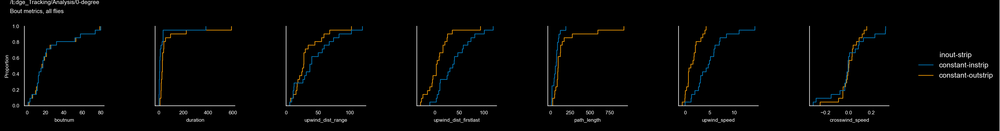

/Users/julianarhee/Documents/rutalab/data/gdrive/0-degree/figures


In [129]:
hue_var='inout-strip'
row_var=None
cumulative=True
plot_type = 'ecdf' if cumulative else 'hist'
labels=flydf['inout-strip'].unique()
colors=sns.color_palette('colorblind', n_colors=4)

plot_vars = ['boutnum', 'path_length', 'duration', \
             'upwind_dist_range', 'upwind_dist_firstlast',
            'upwind_speed', 'crosswind_speed']
if cumulative:
    fig = butil.plot_metrics_displot(flydf, plot_vars, hue_var=hue_var, row_var=row_var,
                    labels=labels, colors=colors, height=2.5)
else:
    fig = butil.plot_metrics_hist(flydf, plot_vars, hue_var=hue_var, row_var=row_var,
                             labels=labels, colors=colors, cumulative=cumulative, stat=stat)
pl.tight_layout()
pl.subplots_adjust(top=0.8, right=0.9, wspace=0.3)

fig.text(0.01, 0.9, "Bout metrics, all flies", fontsize=8)

util.label_figure(fig, fig_id)
figname = '{}-metrics_averaged-fly'.format(plot_type)
pl.savefig(os.path.join(figdir, '{}.png'.format(figname)))
print(figdir)

In [ ]:
# hue_var='inout-strip'
# row_var=None
# cumulative=True
# plot_type = 'ecdf' if cumulative else 'hist'
# labels=flydf['inout-strip'].unique()
# colors=sns.color_palette('colorblind', n_colors=4)

# plot_vars = ['upwind_speed', 'crosswind_speed', 'duration', \
#              'upwind_dist_range', 'upwind_dist_firstlast']
# if cumulative:
#     fig = butil.plot_metrics_displot(flydf, plot_vars, hue_var=hue_var, row_var=row_var,
#                     labels=labels, colors=colors, height=2.5)
# else:
#     fig = butil.plot_metrics_hist(flydf, plot_vars, hue_var=hue_var, row_var=row_var,
#                              labels=labels, colors=colors, cumulative=cumulative, stat=stat)
# pl.tight_layout()
# pl.subplots_adjust(top=0.8, right=0.9, wspace=0.3)

# fig.text(0.01, 0.9, "Bout metrics, all flies", fontsize=8)


# util.label_figure(fig, fig_id)

# figname = '{}-metrics_averaged-fly'.format(plot_type)
# pl.savefig(os.path.join(figdir, '{}.png'.format(figname)))
# print(save_dir)

<IPython.core.display.Javascript object>


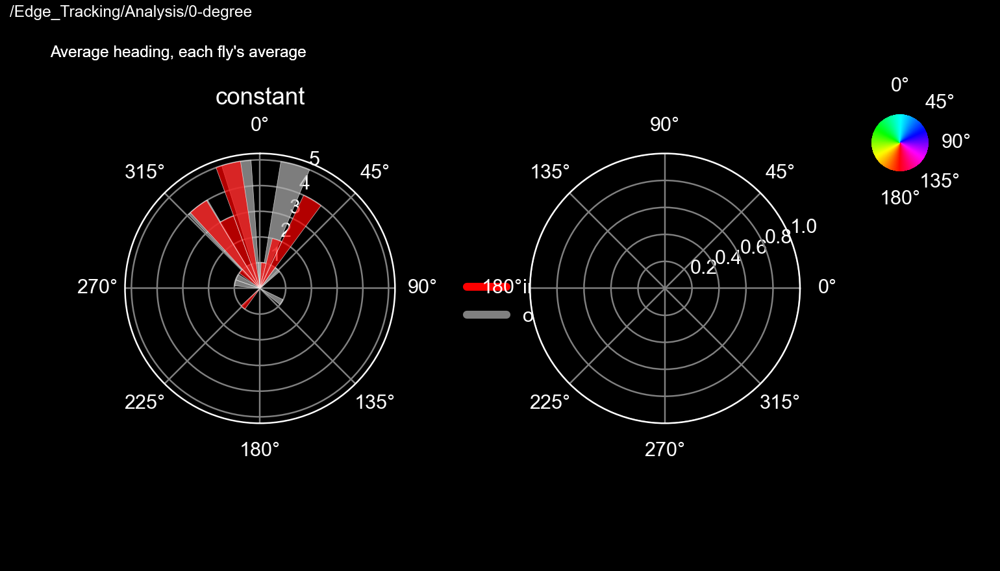

/Users/julianarhee/Documents/rutalab/data/gdrive/0-degree/figures polarhist_average_heading_averaged-fly


In [130]:
fig, axn = pl.subplots(1, 2, figsize=(7,4), subplot_kw={'projection': 'polar'})
for ax, (strip_type, df_) in zip(axn.flat, flydf.groupby('strip_type')):
    util.circular_hist(ax, df_[~df_['instrip']]['average_heading'].values, 
                   facecolor=outstrip_c, density=False, edgecolor='w', lw=0.25)
    util.circular_hist(ax, df_[df_['instrip']]['average_heading'].values, 
                   facecolor=instrip_c, density=False,  edgecolor='w', lw=0.25)
    ax.set_title(strip_type)

labels= ['instrip', 'outstrip']
legh = putil.custom_legend(labels, ['r', 'gray'])
ax.legend(handles=legh, labels=labels, bbox_to_anchor=(1.2, 0.6), loc='upper left', frameon=False)
util.add_colorwheel(fig, cmap='hsv', axes=[0.85, 0.7, 0.1, 0.1])

fig.text(0.05, 0.9, "Average heading, each fly's average", fontsize=8)

util.label_figure(fig, fig_id)
pl.subplots_adjust(right=0.8, wspace=0.5)
figname = 'polarhist_average_heading_averaged-fly'
pl.savefig(os.path.join(figdir, '{}.png'.format(figname)))
print(figdir, figname)

<IPython.core.display.Javascript object>


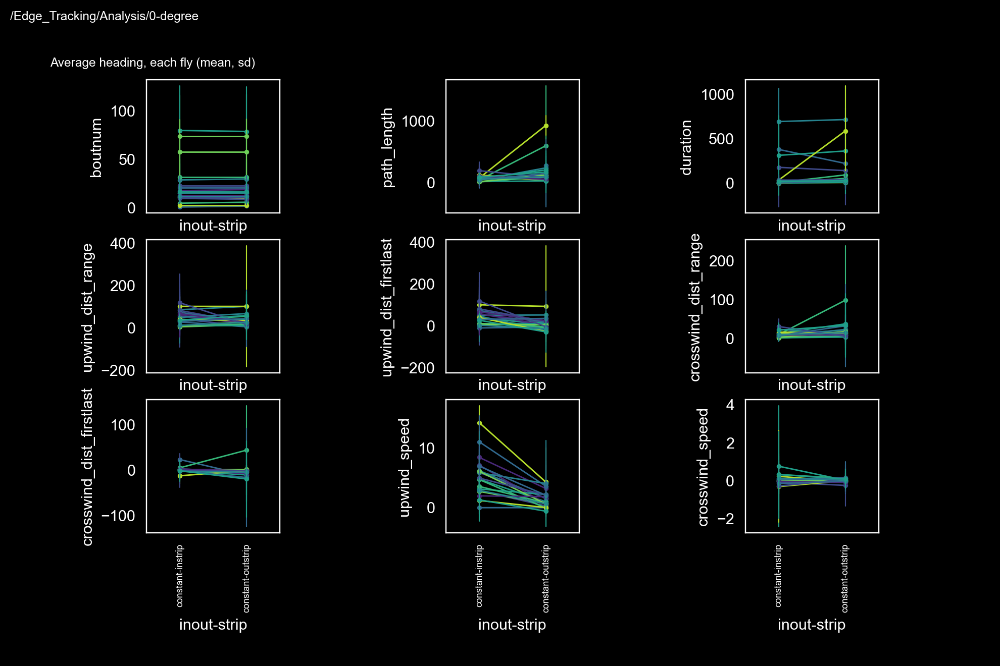

In [132]:
#plot_vars = ['path_length', 'duration', 'upwind_speed', 'crosswind_speed']
cmap = sns.color_palette('viridis', n_colors=8)
plot_vars = ['boutnum', 'path_length', 'duration', 'upwind_dist_range', 'upwind_dist_firstlast', \
             'crosswind_dist_range', 'crosswind_dist_firstlast']
plot_vars.extend([ 'upwind_speed', 'crosswind_speed'])
     
estimator = 'mean'
errorbar = 'sd'
fig.text(0.05, 0.9, "Average heading, each fly's average", fontsize=8)

fig, axn = pl.subplots(3, 3, figsize=(9,6), sharex=True)
for pi, pvar in enumerate(plot_vars):
    ax=axn.flat[pi]
    sns.pointplot(data=metrics, x='inout-strip', y=pvar, ax=ax, hue='fly_id', palette=cmap,
                  scale=0.35, errwidth=0.7, join=True, 
                  estimator=estimator, errorbar=errorbar) #('ci', 95))
    ax.legend_.remove()# legend=False)
    ax.set_box_aspect(1)
    #ax.set_title(pvar)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, fontsize=6)
pl.subplots_adjust(wspace=0.7, bottom=0.2)

fig.text(0.05, 0.9, "Average heading, each fly ({}, {})".format(estimator, errorbar), fontsize=8)

util.label_figure(fig, fig_id)
figname = 'metics_paired_by_fly_allconds_{}-{}'.format(estimator, errorbar)
pl.savefig(os.path.join(figdir, '{}.png'.format(figname)))

# across time

In [135]:
df0.columns

Index(['timestamp -- motor_step_command', 'mfc1_stpt', 'mfc2_stpt',
       'mfc3_stpt', 'led1_stpt', 'led2_stpt', 'sig_status', 'ft_posx',
       'ft_posy', 'ft_frame', 'ft_error', 'ft_roll', 'ft_pitch', 'ft_yaw',
       'ft_heading', 'instrip', 'filename', 'timestamp', 'motor_step_command',
       'time', 'rel_time', 'date', 'led_on', 'experiment', 'fly_name',
       'condition', 'trial', 'fly_id', 'trial_id', 'boutnum', 'cum_time',
       'speed', 'upwind_speed', 'crosswind_speed', 'euclid_dist',
       'upwind_dist', 'crosswind_dist', 'flipped', 'strip_type', 'bout_type',
       'inout-strip'],
      dtype='object')

#### bout duration over time

In [197]:
metrics.columns

Index(['fly_id', 'condition', 'boutnum', 'level_3', 'duration',
       'upwind_dist_range', 'upwind_dist_firstlast', 'crosswind_dist_range',
       'crosswind_dist_firstlast', 'path_length', 'average_heading',
       'rel_time', 'speed', 'upwind_speed', 'crosswind_speed', 'mfc2_stpt',
       'led2_stpt', 'sig_status', 'instrip', 'filename', 'date', 'experiment',
       'fly_name', 'trial', 'trial_id', 'flipped', 'strip_type', 'bout_type',
       'inout-strip', 'mfc1_stpt', 'mfc3_stpt', 'led1_stpt', 'led_on'],
      dtype='object')

In [136]:
# ibi = df_fp.groupby(['trial_id', 'boutnum', 'instrip']).first()['rel_time'].diff().reset_index()
# ibi.loc[ibi['boutnum']==1, 'rel_time'] = np.nan
# ibi = ibi.rename(columns={'rel_time': 'duration'})
grouper = ['trial_id', 'boutnum', 'instrip', 'inout-strip', 'condition', 'bout_type', 'strip_type']
ibi = (df0.groupby(grouper)['time'].last() \
        - df0.groupby(grouper)['time'].first()).reset_index()
ibi = ibi.rename(columns={'time': 'duration'})
ibi['time'] = df0.groupby(grouper).first()['rel_time'].values
# ibi.loc[ibi['instrip'], 'bouttype'] = 'instrip'
# ibi.loc[~ibi['instrip'], 'bouttype'] = 'outstrip'

In [206]:
fly_id = '20220609-fly1' 
df_ = metrics[metrics['fly_id']==fly_id]


In [ ]:
`/get_bou

<IPython.core.display.Javascript object>


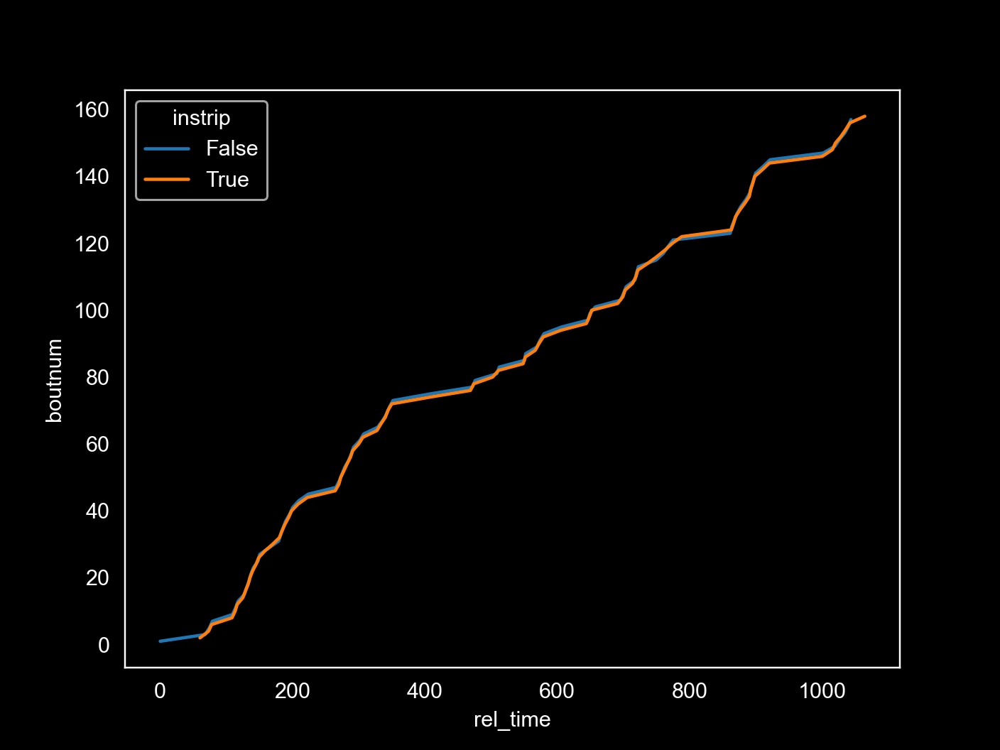

<AxesSubplot: xlabel='rel_time', ylabel='boutnum'>

In [208]:
fig, ax= pl.subplots()
sns.lineplot(data=df_, x='rel_time', y='boutnum', hue='instrip', ax=ax)

<IPython.core.display.Javascript object>


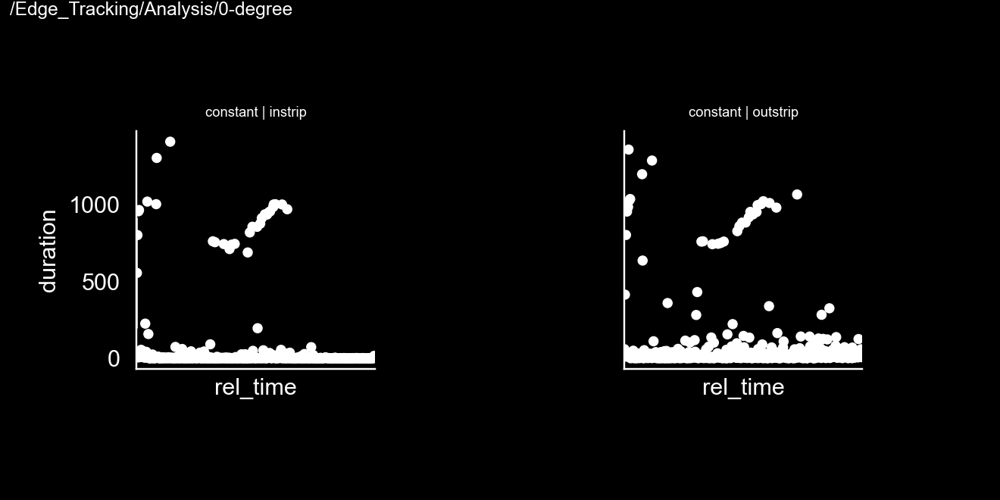

In [198]:
#out_to_in = metrics[metrics['instrip']].copy()
#in_to_out = ibi[~ibi['instrip']].copy()
# ---
plot_individuals=False
xvar='rel_time'
yvar='duration'

trial_ids=ibi['trial_id'].unique()
g = sns.FacetGrid(data=metrics, col='bout_type', row='strip_type', height=3)
g.map_dataframe(sns.pointplot, x=xvar, y=yvar,
                palette=['w'], errwidth=0.5, scale=0.5)
g.set_titles(row_template = '{row_name}', col_template = '{col_name}', size=6)
for ai, ax in enumerate(g.axes.flat):
    ax.set_box_aspect(1)
    for label in ax.xaxis.get_ticklabels()[0:]:
        label.set_visible(False)
pl.subplots_adjust(top=0.8, bottom=0.2)
util.label_figure(g.fig, fig_id)

In [137]:
d_list = []
for trial_id, df_ in ibi.groupby('trial_id'):
    start_bout = sorted(df_[~df_['instrip']]['boutnum'].unique())[0]
    if start_bout == 1:
        start_bout = sorted(df_[~df_['instrip']]['boutnum'].unique())[1]
    end_bout = sorted(df_[df_['instrip']]['boutnum'].unique())[-1]
    incl_bouts = [b for b in df_['boutnum'].unique() if b>=start_bout and b<=end_bout]
    d_list.append(df_[df_['boutnum'].isin(incl_bouts)])
midbouts = pd.concat(d_list)  

In [964]:
importlib.reload(util)

<module 'utils' from '/Users/julianarhee/Repositories/plume-tracking/utils.py'>

In [139]:
for trial_id, df_ in midbouts.groupby('trial_id'):
    midbouts.loc[df_.index, 'time_normed'] = df_['time']/df_['time'].max()

In [140]:
midbouts

,trial_id,boutnum,instrip,inout-strip,condition,bout_type,strip_type,duration,time,time_normed
1,20200904-fly1_09042020-112635,2,False,constant-outstrip,cantons_constantodor,outstrip,constant,415.126799,10.769246,0.016560
2,20200904-fly1_09042020-112635,3,True,constant-instrip,cantons_constantodor,instrip,constant,1.799193,425.913998,0.654934
3,20200904-fly1_09042020-112635,4,False,constant-outstrip,cantons_constantodor,outstrip,constant,4.060137,427.730139,0.657727
4,20200904-fly1_09042020-112635,5,True,constant-instrip,cantons_constantodor,instrip,constant,1.497991,431.810223,0.664001
5,20200904-fly1_09042020-112635,6,False,constant-outstrip,cantons_constantodor,outstrip,constant,1.664540,433.322182,0.666326
...,...,...,...,...,...,...,...,...,...,...
989,20220613-fly9_06132022-164625,28,True,constant-instrip,cantons_constantodor,instrip,constant,6.771667,588.604126,0.949050
990,20220613-fly9_06132022-164625,29,False,constant-outstrip,cantons_constantodor,outstrip,constant,1.644176,595.407134,0.960019
991,20220613-fly9_06132022-164625,30,True,constant-instrip,cantons_constantodor,instrip,constant,0.870551,597.084480,0.962723
992,20220613-fly9_06132022-164625,31,False,constant-outstrip,cantons_constantodor,outstrip,constant,22.184405,597.987073,0.964178


<IPython.core.display.Javascript object>


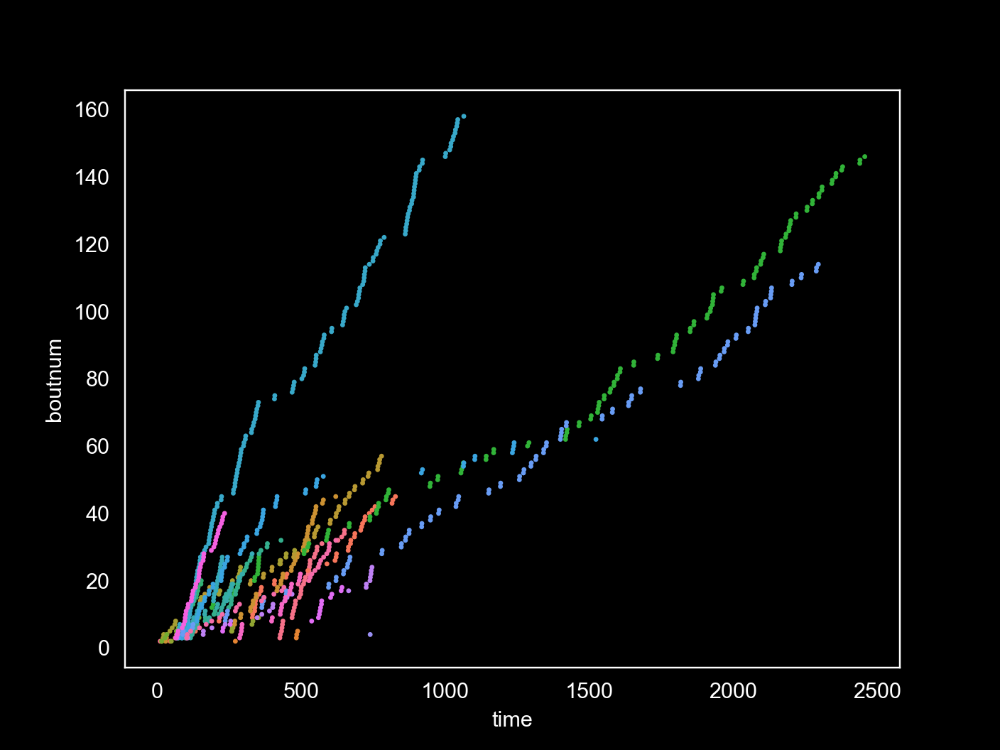

In [141]:
fig, ax = pl.subplots()

ax = sns.scatterplot(data=midbouts, x='time', y='boutnum', ax=ax, 
                edgecolor='none', s=5, hue='trial_id', legend=False)
#ax.set(yscale ='log')
#ax.set_xlim([0, 100])

In [142]:
# metrics = df0.groupby(['fly_id', 'condition', 'boutnum']).apply(calculate_bout_metrics).reset_index()
df0.columns

Index(['timestamp -- motor_step_command', 'mfc1_stpt', 'mfc2_stpt',
       'mfc3_stpt', 'led1_stpt', 'led2_stpt', 'sig_status', 'ft_posx',
       'ft_posy', 'ft_frame', 'ft_error', 'ft_roll', 'ft_pitch', 'ft_yaw',
       'ft_heading', 'instrip', 'filename', 'timestamp', 'motor_step_command',
       'time', 'rel_time', 'date', 'led_on', 'experiment', 'fly_name',
       'condition', 'trial', 'fly_id', 'trial_id', 'boutnum', 'cum_time',
       'speed', 'upwind_speed', 'crosswind_speed', 'euclid_dist',
       'upwind_dist', 'crosswind_dist', 'flipped', 'strip_type', 'bout_type',
       'inout-strip'],
      dtype='object')

In [143]:
#tpoints = df0.groupby(['fly_id', 'condition', 'boutnum']).first()['rel_time'].reset_index()

In [144]:
#metrics1 = pd.merge(metrics, tpoints)
#metrics1

In [145]:
tmin, tmax = metrics['rel_time'].min(), metrics['rel_time'].max()
bins = np.arange(tmin, tmax, 10)
bins

array([   0.,   10.,   20.,   30.,   40.,   50.,   60.,   70.,   80.,
         90.,  100.,  110.,  120.,  130.,  140.,  150.,  160.,  170.,
        180.,  190.,  200.,  210.,  220.,  230.,  240.,  250.,  260.,
        270.,  280.,  290.,  300.,  310.,  320.,  330.,  340.,  350.,
        360.,  370.,  380.,  390.,  400.,  410.,  420.,  430.,  440.,
        450.,  460.,  470.,  480.,  490.,  500.,  510.,  520.,  530.,
        540.,  550.,  560.,  570.,  580.,  590.,  600.,  610.,  620.,
        630.,  640.,  650.,  660.,  670.,  680.,  690.,  700.,  710.,
        720.,  730.,  740.,  750.,  760.,  770.,  780.,  790.,  800.,
        810.,  820.,  830.,  840.,  850.,  860.,  870.,  880.,  890.,
        900.,  910.,  920.,  930.,  940.,  950.,  960.,  970.,  980.,
        990., 1000., 1010., 1020., 1030., 1040., 1050., 1060., 1070.,
       1080., 1090., 1100., 1110., 1120., 1130., 1140., 1150., 1160.,
       1170., 1180., 1190., 1200., 1210., 1220., 1230., 1240., 1250.,
       1260., 1270.,

In [146]:
 # cut time axis into bins, count N bouts

In [147]:
labels = bins[1:]
df0['time_bin'] = pd.cut(df0['rel_time'], bins=bins, labels=labels)
df0.head()

,timestamp -- motor_step_command,mfc1_stpt,mfc2_stpt,mfc3_stpt,led1_stpt,led2_stpt,sig_status,ft_posx,ft_posy,ft_frame,...,upwind_speed,crosswind_speed,euclid_dist,upwind_dist,crosswind_dist,flipped,strip_type,bout_type,inout-strip,time_bin
0,09/04/2020-11:26:35.204272 -- 800000,0.966216,0.0,0.009760,0.0,0.0,NaN,0.000000,-0.000000,0,...,-0.207758,0.294261,NaN,NaN,NaN,False,constant,instrip,constant-instrip,NaN
1,09/04/2020-11:26:35.220228 -- 800000,0.966219,0.0,0.009757,0.0,0.0,NaN,0.004695,-0.003315,1,...,0.254146,0.135350,0.005748,-0.003315,0.004695,False,constant,instrip,constant-instrip,10.0
2,09/04/2020-11:26:35.236691 -- 799999,0.966208,0.0,0.009768,0.0,0.0,NaN,0.004388,0.008239,2,...,-0.521708,-0.135029,0.011558,0.011554,0.000307,False,constant,instrip,constant-instrip,10.0
3,09/04/2020-11:26:35.254644 -- 799999,0.966237,0.0,0.009739,0.0,0.0,NaN,0.000048,-0.021270,3,...,-0.376575,0.207642,0.029827,-0.029509,0.004340,False,constant,instrip,constant-instrip,10.0
4,09/04/2020-11:26:35.270601 -- 799999,0.966221,0.0,0.009755,0.0,0.0,NaN,0.011429,-0.004531,4,...,0.521770,0.290852,0.020242,0.016740,0.011381,False,constant,instrip,constant-instrip,10.0


In [149]:
# grouper = [ 'trial_id',  'boutnum', 'strip_type',\
#            'bout_type', 'inout-strip']
# grouper.append('time_bin')

ign_cols = ['experiment', 'fly_name', 'trial', 'motor_step_command', 'led2_stpt', 'level_3',
           'mfc1_stpt', 'mfc2_stpt', 'mfc3_stpt', 'led1_stpt', 'date']
quant_cols = [c for c in metrics.columns if c not in ign_cols]

quant_grouper = ['fly_id', 'trial_id', 'instrip', 'condition', \
                 'strip_type', 'bout_type', 'inout-strip', 'boutnum']
# meandf = metrics[quant_cols].groupby(quant_grouper).mean().reset_index()


In [150]:
df0.columns

Index(['timestamp -- motor_step_command', 'mfc1_stpt', 'mfc2_stpt',
       'mfc3_stpt', 'led1_stpt', 'led2_stpt', 'sig_status', 'ft_posx',
       'ft_posy', 'ft_frame', 'ft_error', 'ft_roll', 'ft_pitch', 'ft_yaw',
       'ft_heading', 'instrip', 'filename', 'timestamp', 'motor_step_command',
       'time', 'rel_time', 'date', 'led_on', 'experiment', 'fly_name',
       'condition', 'trial', 'fly_id', 'trial_id', 'boutnum', 'cum_time',
       'speed', 'upwind_speed', 'crosswind_speed', 'euclid_dist',
       'upwind_dist', 'crosswind_dist', 'flipped', 'strip_type', 'bout_type',
       'inout-strip', 'time_bin'],
      dtype='object')

In [156]:
grouper = ['fly_id', 'trial_id', 'instrip', \
                 'strip_type', 'bout_type', 'inout-strip', 'time_bin']
df0.groupby(grouper)['boutnum'].count() #mean().reset_index()


fly_id         trial_id                       instrip  strip_type  bout_type  inout-strip        time_bin
20200904-fly1  20200904-fly1_09042020-112635  False    constant    instrip    constant-instrip   10.0        0
                                                                                                 20.0        0
                                                                                                 30.0        0
                                                                                                 40.0        0
                                                                                                 50.0        0
                                                                                                            ..
20220613-fly9  20220613-fly9_06132022-164625  True     constant    outstrip   constant-outstrip  2430.0      0
                                                                                                 2440.0      0
      

In [158]:
df0[[]].groupby(['trial_id', 'time_bin'])['boutnum' ].count()

trial_id                       time_bin
20200904-fly1_09042020-112635  10.0        600
                               20.0        601
                               30.0        601
                               40.0        600
                               50.0        598
                                          ... 
20220613-fly9_06132022-164625  2430.0        0
                               2440.0        0
                               2450.0        0
                               2460.0        0
                               2470.0        0
Name: boutnum, Length: 5928, dtype: int64

In [189]:
cols = ['fly_id', 'trial_id', 'instrip', \
                 'strip_type', 'bout_type', 'inout-strip', 'time_bin', 'boutnum']
grouper = ['trial_id', 'instrip', \
                 'strip_type', 'bout_type', 'inout-strip', 'time_bin']
tmpdf = df0[cols].drop_duplicates()


In [190]:
tmpdf[(tmpdf['trial_id']==trial_id) & (tmpdf['time_bin']==100)]['boutnum'].count()

1

In [193]:
boutcounts = tmpdf.groupby(['trial_id', 'inout-strip', 'time_bin'])['boutnum'].count().reset_index()
boutcounts.head()

,trial_id,inout-strip,time_bin,boutnum
0,20200904-fly1_09042020-112635,constant-instrip,10.0,1
1,20200904-fly1_09042020-112635,constant-instrip,20.0,1
2,20200904-fly1_09042020-112635,constant-instrip,30.0,0
3,20200904-fly1_09042020-112635,constant-instrip,40.0,0
4,20200904-fly1_09042020-112635,constant-instrip,50.0,0


In [171]:
fig, ax= pl.subplots()


,fly_id,trial_id,instrip,strip_type,bout_type,inout-strip,time_bin,boutnum
0,20200904-fly1,20200904-fly1_09042020-112635,False,constant,instrip,constant-instrip,10.0,0
1,20200904-fly1,20200904-fly1_09042020-112635,False,constant,instrip,constant-instrip,20.0,0
2,20200904-fly1,20200904-fly1_09042020-112635,False,constant,instrip,constant-instrip,30.0,0
3,20200904-fly1,20200904-fly1_09042020-112635,False,constant,instrip,constant-instrip,40.0,0
4,20200904-fly1,20200904-fly1_09042020-112635,False,constant,instrip,constant-instrip,50.0,0
...,...,...,...,...,...,...,...,...
995899,20220613-fly9,20220613-fly9_06132022-164625,True,constant,outstrip,constant-outstrip,2430.0,0
995900,20220613-fly9,20220613-fly9_06132022-164625,True,constant,outstrip,constant-outstrip,2440.0,0
995901,20220613-fly9,20220613-fly9_06132022-164625,True,constant,outstrip,constant-outstrip,2450.0,0
995902,20220613-fly9,20220613-fly9_06132022-164625,True,constant,outstrip,constant-outstrip,2460.0,0


In [155]:
trial_id = '20220609-fly1_06092022-155055'
metrics[metrics['trial_id']==trial_id].groupby(['instrip', 'boutnum']).mean()

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_3861/3074045532.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  metrics[metrics['trial_id']==trial_id].groupby(['instrip', 'boutnum']).mean()


level_3
instrip boutnum         
False   1            0.0
        3            0.0
        5            0.0
        7            0.0
        9            0.0
...                  ...
True    150          0.0
        152          0.0
        154          0.0
        156          0.0
        158          0.0

[158 rows x 1 columns]